# 1. Giới thiệu đồ án

Phát hiện khói và lửa là một nhiệm vụ tối quan trọng để đảm bảo an toàn công cộng và ngăn ngừa các rủi ro tại trung tâm dữ liệu. Với những tiến bộ gần đây trong lĩnh vực Thị giác máy tính (Computer Vision) và Học sâu (Deep Learning), việc xây dựng các hệ thống phát hiện khói và lửa chính xác bằng cách sử dụng tập dữ liệu tùy chỉnh đã trở nên khả thi. Một hệ thống như vậy là YOLOv8, một mô hình phát hiện đối tượng (object detection model) hiện đại, có thể được huấn luyện (trained) trên một tập dữ liệu tùy chỉnh để phát hiện khói và lửa.

## Mục tiêu của notebook này:

- Tải xuống và đánh giá tập dữ liệu phát hiện khói và lửa từ Kaggle.
- Chuẩn bị dữ liệu cho quá trình huấn luyện mô hình phát hiện đối tượng.
- Huấn luyện mô hình YOLOv8 trên tập dữ liệu tùy chỉnh để phát hiện khói và lửa.
- Đánh giá hiệu suất của mô hình đã được huấn luyện.
- Lưu trữ và kiểm thử mô hình đã huấn luyện.

## Các thư viện và Framework chính

Các thư viện và framework chính được sử dụng trong notebook này bao gồm:

*   **kagglehub**: Để tải tập dữ liệu từ Kaggle.
*   **os**: Để tương tác với hệ điều hành và quản lý đường dẫn file.
*   **random**: Để tạo số ngẫu nhiên, được sử dụng khi chọn mẫu ảnh.
*   **cv2 (OpenCV)**: Thư viện xử lý ảnh và thị giác máy tính, được sử dụng để đọc, xử lý và vẽ lên ảnh (ví dụ: vẽ bounding box).
*   **glob**: Để tìm kiếm các file theo pattern trong hệ thống file.
*   **pandas**: Để phân tích và xử lý dữ liệu, đặc biệt là làm việc với các file CSV (ví dụ: kết quả huấn luyện).
*   **matplotlib**: Để tạo biểu đồ và đồ thị hóa dữ liệu (ví dụ: phân bố class, kết quả huấn luyện).
*   **collections.Counter**: Để đếm số lượng các đối tượng (ví dụ: số lượng class trong dataset).
*   **albumentations**: Thư viện tăng cường dữ liệu cho hình ảnh.
*   **albumentations.pytorch.ToTensorV2**: Biến đổi ảnh từ Albumentations sang tensor PyTorch.
*   **ultralytics**: Framework chứa mô hình YOLOv8 và các công cụ liên quan để huấn luyện và dự đoán.
*   **IPython.display**: Để hiển thị hình ảnh và output trong notebook.
*   **shutil**: Để thực hiện các thao tác cấp cao trên file và thư mục (ví dụ: sao chép file).

## Thuộc tính của Mô hình
### Kiểu Học (Learning Type)
Mô hình được sử dụng trong notebook này áp dụng Học có giám sát (Supervised Learning). Điều này là do mô hình được huấn luyện trên một tập dữ liệu đã được gán nhãn (labeled dataset), trong đó mỗi hình ảnh đi kèm với các hộp giới hạn (bounding box) và nhãn lớp (class label) cho các đối tượng khói và lửa.

### Kiểu Mô hình (Model Type)
Đây là một mô hình Phát hiện đối tượng thời gian thực (Real-time Object Detection). YOLO (You Only Look Once) là một họ các mô hình nổi tiếng về khả năng phát hiện đối tượng hiệu quả và nhanh chóng, phù hợp cho các ứng dụng yêu cầu xử lý video hoặc hình ảnh trực tiếp.

### Mô hình Tiền Huấn luyện (Pre-trained Model)
Mô hình cơ sở được sử dụng là YOLOv8n.pt. Đây là một phiên bản nhỏ (nano) của kiến trúc YOLOv8, đã được tiền huấn luyện trên một tập dữ liệu lớn (thường là [COCO dataset](https://cocodataset.org/#home)).

### Ultralytics và YOLO
YOLO (You Only Look Once): Là tên của một kiến trúc mạng nơ-ron (neural network architecture) được thiết kế cho tác vụ phát hiện đối tượng. Các mô hình YOLO xử lý toàn bộ hình ảnh trong một lần duy nhất để dự đoán các hộp giới hạn và xác suất lớp, giúp đạt được tốc độ xử lý cao.
Ultralytics: Là công ty phát triển và duy trì các phiên bản mới nhất của YOLO, bao gồm YOLOv8. Ultralytics cung cấp một framework và các công cụ đi kèm để dễ dàng sử dụng, huấn luyện và triển khai các mô hình YOLO. Framework ultralytics được sử dụng trong notebook này để làm việc với mô hình YOLOv8.
Chuyển giao Học tập (Transfer Learning)
Quá trình huấn luyện trong notebook này sử dụng kỹ thuật Chuyển giao học tập (Transfer Learning). Cụ thể, chúng ta lấy một mô hình YOLOv8 đã được tiền huấn luyện trên một tập dữ liệu chung (như COCO) và sau đó tinh chỉnh (fine-tune) mô hình này trên tập dữ liệu tùy chỉnh về khói và lửa. Điều này giúp mô hình học hỏi từ các đặc trưng đã được học trước đó và thích ứng nhanh hơn với nhiệm vụ phát hiện khói và lửa với lượng dữ liệu tùy chỉnh nhỏ hơn.

### Chức năng của Mô hình Cuối cùng
Mô hình cuối cùng sau khi được huấn luyện sẽ có khả năng Phát hiện và định vị các đối tượng khói và lửa trong hình ảnh hoặc video đầu vào. Đối với mỗi đối tượng được phát hiện, mô hình sẽ cung cấp:

Lớp của đối tượng (Smoke hoặc Fire).
Hộp giới hạn (Bounding Box) chỉ ra vị trí của đối tượng.
Điểm tin cậy (Confidence Score) cho biết mức độ chắc chắn của mô hình về dự đoán đó.


### Vận dụng vision model cho web app nhận diện khói lửa

Với mô hình YOLOv8 đã được huấn luyện trên tập dữ liệu tùy chỉnh về khói và lửa, đồ án này hướng tới việc xây dựng một ứng dụng thực tế để trình diễn khả năng phát hiện này.

Các bước tiếp theo bao gồm:

- Sử dụng mô hình YOLOv8 đã huấn luyện để xây dựng một ứng dụng web.
- Ứng dụng web sẽ cho phép người dùng tải lên hình ảnh hoặc video để mô hình dự đoán vị trí khói và lửa.
- Sử dụng framework Gradio để phát triển giao diện người dùng cho ứng dụng web một cách nhanh chóng.
- Triển khai (host) mô hình và ứng dụng web trên nền tảng Hugging Face Spaces để mọi người có thể dễ dàng truy cập và kiểm thử.
- Lưu trữ mô hình đã huấn luyện trên Hugging Face Hub để có thể tái sử dụng hoặc chia sẻ.

# 2. Tải và đánh giá dataset

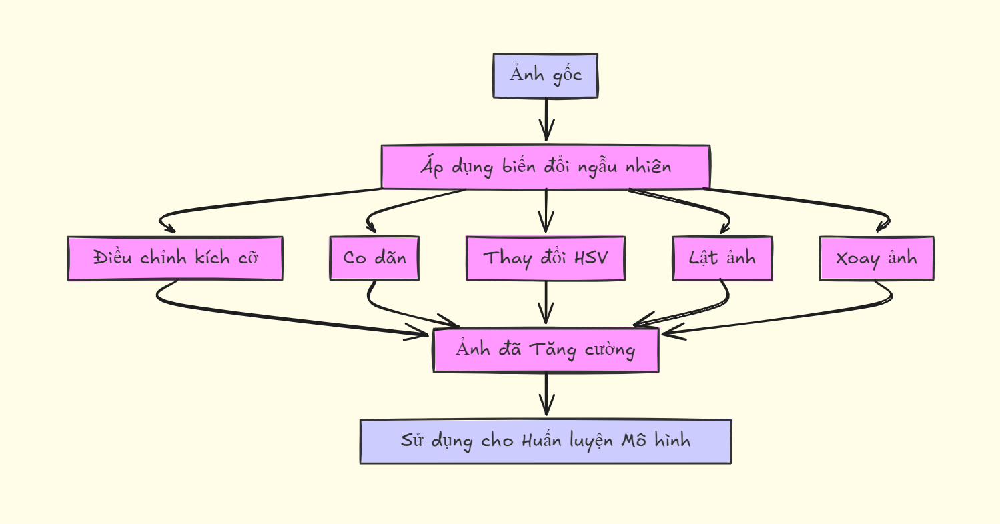

Các Bước Tiền xử lý Dữ liệu

*   **Thay đổi Kích thước (Resize)**:
    *   Tất cả hình ảnh được thay đổi kích thước thành 608x608 pixel bằng cách sử dụng Albumentations (Lưu ý: YOLOv8 mặc định sử dụng 640x640, nhưng tùy chỉnh kích thước có thể được áp dụng).
*   **Chuẩn hóa (Normalization)**:
    *   Áp dụng chuẩn hóa theo tiêu chuẩn ImageNet với giá trị trung bình (mean) = (0.485, 0.456, 0.406) và độ lệch chuẩn (std) = (0.229, 0.224, 0.225).
*   **Tăng cường Dữ liệu (Data Augmentation)**:
    *   Lật ngang (Horizontal Flip) với xác suất 50%.
    *   Điều chỉnh độ sáng và độ tương phản ngẫu nhiên (Random Brightness and Contrast adjustment).
    *   Biến đổi màu sắc ngẫu nhiên (Color Jittering).
    *   Xoay ngẫu nhiên 90 độ (Random 90-degree rotation).
*   **Xử lý Hộp giới hạn (Bounding Box Handling)**:
    *   Hộp giới hạn định dạng YOLO vẫn được căn chỉnh chính xác sau các biến đổi.
*   **Chia Tập dữ liệu (Splits)**:
    *   Bộ dữ liệu đã được chia sẵn thành các tập huấn luyện (train), kiểm định (valid) và kiểm thử (test).

## 2.1 Tải Dataset từ Kagglehub

Link: https://www.kaggle.com/datasets/roscoekerby/firesmoke-detection-yolo-v9

Data set này chứa ảnh sample có khói và lửa, tất cả đều được lưu dưới định dạng YOLO, nhằm hỗ trợ cho supervised, transfer learning cho object detection vision model.

Có 3 folder:
- **Train**: Chứa ảnh được label, dùng trực tiếp cho quá trình train
- **Valid**: Chứa ảnh được label, dùng cho quá trình training để đối chiếu kết quả thực tế với kết quả mong đợi
- **Test**: Dùng sau quá trình training, dùng để đánh giá hiệu suất của model khi xử lý data chưa từng gặp

Mỗi ảnh ở folder images sẽ có một file txt ở folder labels gán tọa độ cho biết khói và lửa nằm ở đâu (vd: `1 0.69921875 0.39921875 0.6015625 0.6546875`)

File `data.yaml` trong dataset giúp định vị các folder và liệt kê các label class, ở đây là khói (smoke) và lửa (fire)

```
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 2
names: ['fire', 'smoke']
```

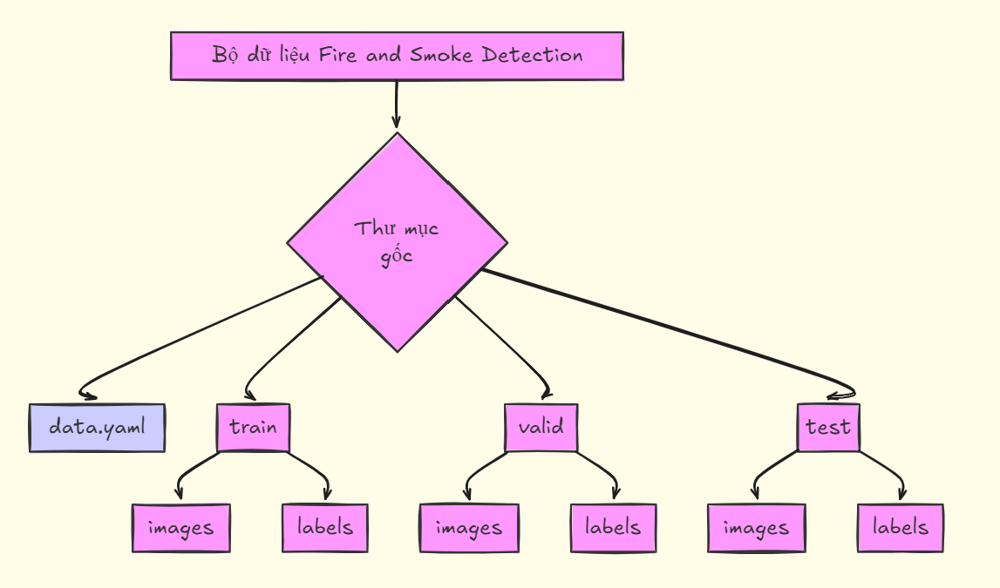

In [10]:
import kagglehub
# trên google colab: chạy code block này 2 lần, lần 1 tải vào cache (/root/.cache/kagglehub/datasets/...), nhấn lần 2 sẽ tự mount vài /kaggle/input/...
# data set này khá nặng (900mb zip), chờ trên 5 phút rồi nhấn chạy lại lần 2, check lại /kaggle/input/
# Download latest version
path = kagglehub.dataset_download("roscoekerby/firesmoke-detection-yolo-v9")

print("Path dẫn đến dataset:", path)

Path dẫn đến dataset: /kaggle/input/firesmoke-detection-yolo-v9


## 2.2 Import thư viện

In [2]:
# nếu code block ở dưới import có lỗi thì tải trước các thư viện
!pip3 install opencv-python tensorflow albumentations Counter matplotlib

  Preparing metadata (setup.py) ... done
  Created wheel for Counter: filename=Counter-1.0.0-py3-none-any.whl size=5392 sha256=00d2c512fe5f10bf91449de1286b937cbbada0a57007743a568af27fbea1cbdc
  Stored in directory: /root/.cache/pip/wheels/08/5b/a0/8f15503db6a45a1d8747bf0f1438411cb37484ac4dfdfe6c0b
Successfully built Counter


In [6]:

# tương tác với hệ điều hành
import os

# tạo số ngẫu nhiên
import random

# thư viện openCV, xử lý hình ảnh, tầm nhìn
import cv2

# xử lý matching pattern, đường dẫn trên hệ thống
import glob

# pandas, phân tích và xử lý data
import pandas as pd

# (quan trọng) training và building mô hình học sâu - deep learning model
import tensorflow as tf

# không quá cần thiết: tạo biểu đồ, đồ thị hóa dữ liệu
import matplotlib.pyplot as plt

# đếm object dạng hash
from collections import Counter

# định dạng, edit ảnh (chỉnh tỉ lệ, mật độ pixel, kích cỡ...)
import albumentations as A

# biến đổi ảnh đã được định djang từ albumentations thành các tensor trong PyTorch
from albumentations.pytorch import ToTensorV2

# chỉnh sửa ảnh
from tensorflow.keras.preprocessing.image import ImageDataGenerator


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.7'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


## 2.3 Định nghĩa path

In [11]:
# define path trong dataset
Dataset_Path = '/kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset'

Train_Path = os.path.join(Dataset_Path, "train")

Valid_Path = os.path.join(Dataset_Path, "valid")

Test_Path = os.path.join(Dataset_Path, "test")

splits = ['train', 'valid', 'test']

## 2.4 Chuẩn bị Trình tạo Dữ liệu (Data Generators) cho Quá trình Huấn luyện Mô hình

Ta cần định nghĩa các trình tạo dữ liệu (data generators) cho các tập huấn luyện (training), kiểm định (validation) và kiểm thử (testing):

- **Trình tạo Dữ liệu Huấn luyện (Training Generator)**: áp dụng các kỹ thuật tăng cường dữ liệu (data augmentation) như xoay (rotation), phóng to (zoom), dịch chuyển chiều rộng/chiều cao (width/height shifts) và lật (flipping) để cải thiện tính mạnh mẽ (robustness) của mô hình.

- **Trình tạo Dữ liệu Kiểm định và Kiểm thử (Validation and Test Generators)**: chỉ thực hiện thay đổi tỷ lệ (rescale) hình ảnh mà không áp dụng tăng cường dữ liệu để đánh giá hiệu suất mô hình một cách chính xác.

In [12]:
Image_Size = (224, 224)
Batch_Size = 32

# Training data with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


# tạo generator
train_generator = train_datagen.flow_from_directory(
    Train_Path,
    target_size=Image_Size,
    batch_size=Batch_Size,
    class_mode='categorical',
    shuffle=True
)

# Chỉnh sửa kết quả data trong /valid/ và /test/
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

valid_generator = valid_datagen.flow_from_directory(
    Valid_Path,
    target_size=Image_Size,
    batch_size=Batch_Size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    Test_Path,
    target_size=Image_Size,
    batch_size=Batch_Size,
    class_mode='categorical',
    shuffle=False
)

Found 35695 images belonging to 2 classes.
Found 4892 images belonging to 2 classes.
Found 2255 images belonging to 2 classes.


## 2.5 Định nghĩa Hàm để Trực quan hóa Hộp giới hạn (Bounding Boxes)

Ta định nghĩa một hàm hỗ trợ plot_image_with_bboxes(img_path, label_path) có chức năng:

- Đọc một hình ảnh và tệp nhãn tương ứng của nó.
- Phân tích thông tin hộp giới hạn (định dạng YOLO).
- Vẽ các hộp giới hạn lên hình ảnh.
- Hiển thị hình ảnh đã được chú thích bằng Matplotlib.

Bước này giúp xác minh trực quan rằng các chú thích là chính xác trước khi tiến hành huấn luyện mô hình.

In [13]:
#định nghĩa hàm tạo hộp có viền
def plot_image_with_bboxes(img_path, label_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    with open(label_path, 'r') as file:
        labels = file.readlines()

    for label in labels:
        class_id, x_center, y_center, bbox_width, bbox_height = map(float, label.split())
        x_center *= w
        y_center *= h
        bbox_width *= w
        bbox_height *= h

        x1 = int(x_center - bbox_width / 2)
        y1 = int(y_center - bbox_height / 2)
        x2 = int(x_center + bbox_width / 2)
        y2 = int(y_center + bbox_height / 2)

        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Showing samples from TRAIN set:


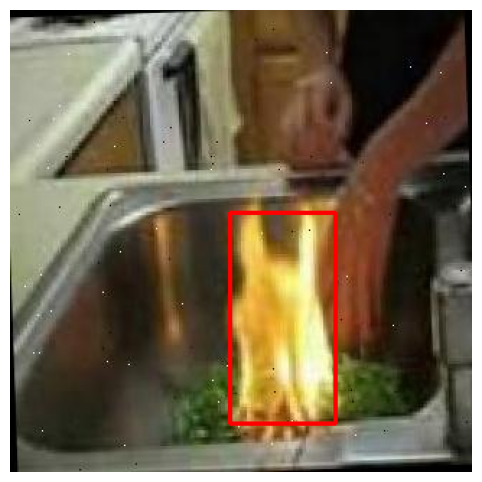

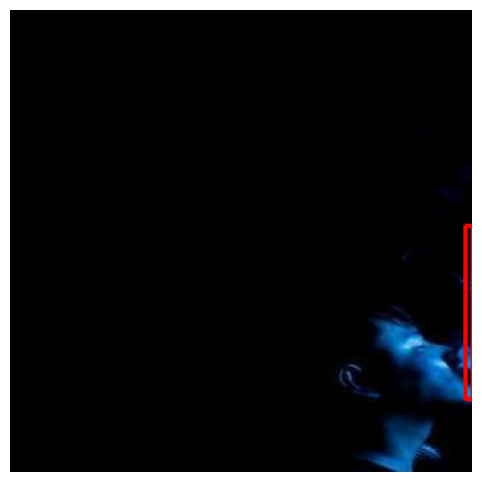

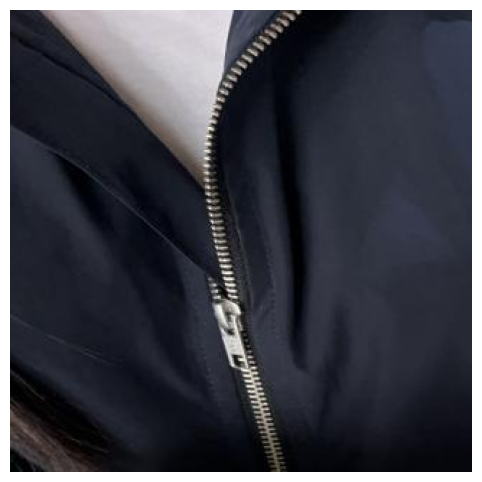

Showing samples from VALID set:


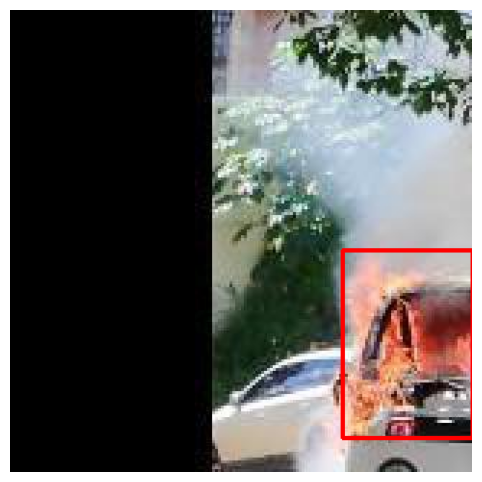

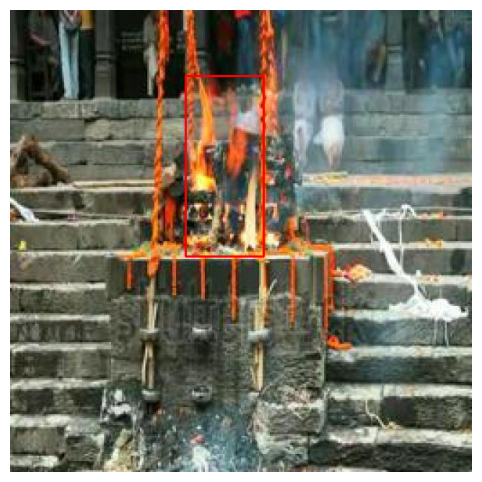

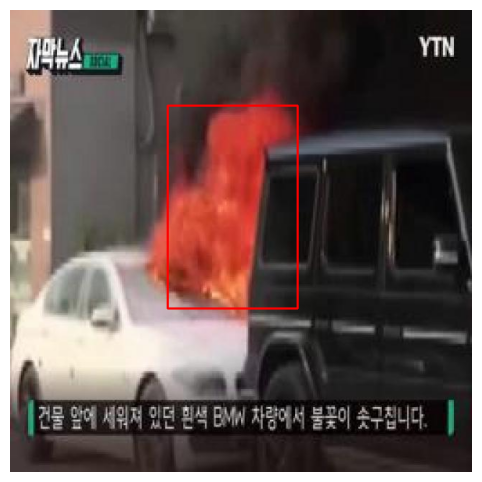

Showing samples from TEST set:


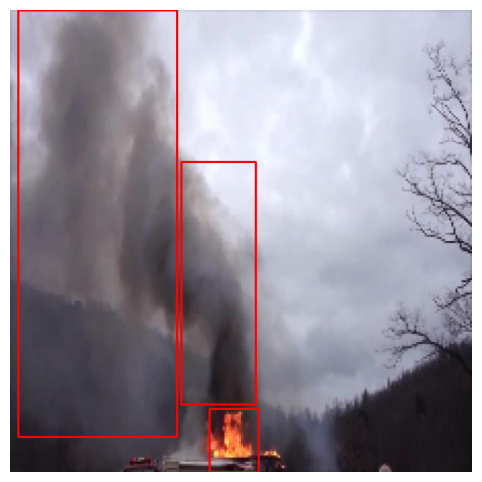

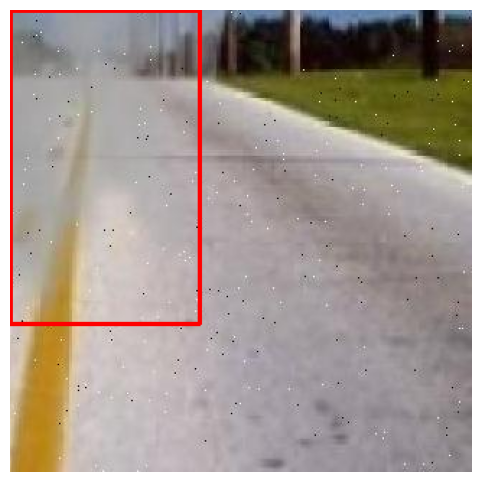

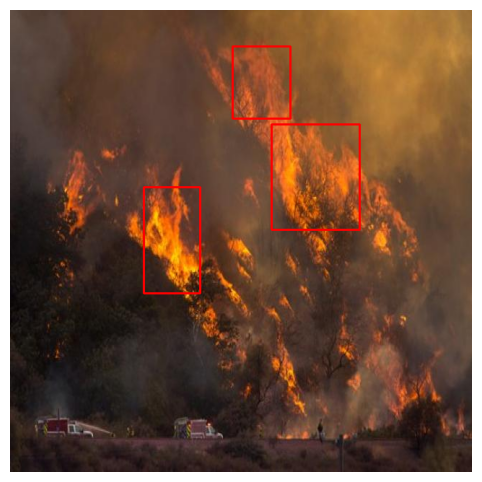

In [16]:
#áp dụng hàm plot_image_with_bboxes vừa định nghĩa, đồ thị thử ảnh ngẫu nhiên trong dataset
for split in splits:
    print(f"Showing samples from {split.upper()} set:")
    images_folder = os.path.join(Dataset_Path, split, 'images')
    labels_folder = os.path.join(Dataset_Path, split, 'labels')

    sample_images = random.sample(os.listdir(images_folder), 3)

    # đọc tọa độ từ file txt tương ứng với mỗi ảnh jpg
    for img_name in sample_images:
        img_path = os.path.join(images_folder, img_name)
        label_path = os.path.join(labels_folder, img_name.replace('.jpg', '.txt'))
        plot_image_with_bboxes(img_path, label_path)

## 2.6 Phân tích phân bổ của nhãn trong dataset

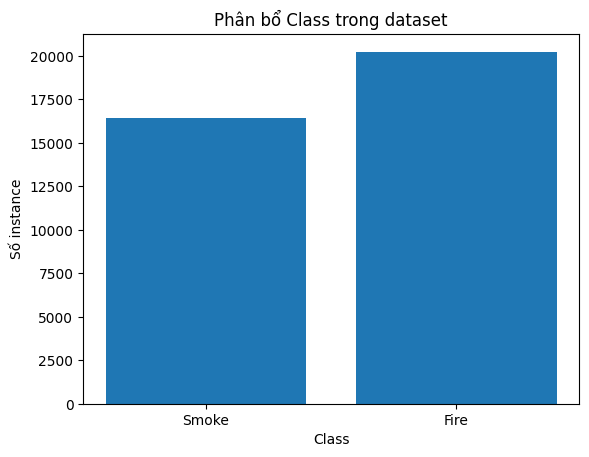

Tỉ lệ: 1.23


In [17]:
# Phân bổ Class trong dataset
def count_classes(labels_dir):
    counter = Counter()
    for label_file in os.listdir(labels_dir):
        if not label_file.endswith('.txt'):
            continue  # bỏ qua file không phải là txt

        filepath = os.path.join(labels_dir, label_file)

        try:
            with open(filepath, 'r') as f:

                for line in f:

                    line = line.strip()

                    if not line:  # bỏ qua hàng không có ký tự
                        continue
                    parts = line.split()

                    if len(parts) >= 1:  # ít nhất phải có một class_id (khói hoặc lửa)
                        class_id = int(parts[0])
                        counter[class_id] += 1
        except Exception as e:
            print(f"Error processing {filepath}: {str(e)}")
            continue

    return counter


# định nghĩa path
train_labels_dir = os.path.join(Dataset_Path, 'train', 'labels')

# đếm class
train_class_counts = count_classes(train_labels_dir)

# vẽ đồ thị
if train_class_counts:
    class_names = {0: "Fire", 1: "Smoke"}  # Update with your actual class mapping
    classes = [class_names.get(id, f"Class_{id}") for id in train_class_counts.keys()]
    counts = list(train_class_counts.values())

    plt.bar(classes, counts)
    plt.xlabel('Class')
    plt.ylabel('Số instance')
    plt.title('Phân bổ Class trong dataset')
    plt.show()

    # Calculate imbalance ratio
    if len(train_class_counts) > 1:
        imbalance_ratio = max(counts) / min(counts)
        print(f"Tỉ lệ: {imbalance_ratio:.2f}")
    else:
        print("Chỉ có một class trong dataset")
else:
    print("Không tìm được class hợp lệ")

## 2.7 Kiểm tra Nhãn bị Thiếu

Chúng ta xác minh rằng mỗi tệp hình ảnh đều có tệp nhãn tương ứng trong tất cả các tập dữ liệu để đảm bảo tính đầy đủ của dữ liệu.

In [18]:
#check có label bị thiếu hay không
def check_missing_labels(images_dir, labels_dir):
    image_files = [os.path.splitext(f)[0] for f in os.listdir(images_dir)]
    label_files = [os.path.splitext(f)[0] for f in os.listdir(labels_dir)]

    missing_labels = list(set(image_files) - set(label_files))
    if missing_labels:
        print(f"{len(missing_labels)} ảnh bị thiếu nhãn.")
        print(missing_labels)
    else:
        print("Tất cả ảnh đều được dán nhãn tương ứng.")

for split in splits:
    print(f"Kiểm tra bộ ảnh {split.upper()}:")
    images_dir = os.path.join(Dataset_Path, split, 'images')
    labels_dir = os.path.join(Dataset_Path, split, 'labels')
    check_missing_labels(images_dir, labels_dir)

Kiểm tra bộ ảnh TRAIN:
Tất cả ảnh đều được dán nhãn tương ứng.
Kiểm tra bộ ảnh VALID:
Tất cả ảnh đều được dán nhãn tương ứng.
Kiểm tra bộ ảnh TEST:
Tất cả ảnh đều được dán nhãn tương ứng.


## 2.8 Báo cáo Phân tích Dữ liệu

1.  **Tổng quan về Bộ dữ liệu**:
    *   Tổng bộ dữ liệu được chia thành ba phần:
        *   Tập huấn luyện (Training set)
        *   Tập kiểm định (Validation set)
        *   Tập kiểm thử (Test set)
    *   Mỗi tập đều chứa cả hình ảnh và chú thích hộp giới hạn (bounding box annotations) tương ứng của chúng.

2.  **Khám phá Mẫu Hình ảnh Trực quan**:
    *   Các hình ảnh được chọn ngẫu nhiên từ mỗi tập đã được trực quan hóa với các hộp giới hạn được vẽ lên.
    *   **Quan sát**:
        *   Các hình ảnh rất đa dạng về hậu cảnh, ánh sáng và khả năng nhìn thấy khói/lửa.
        *   Các hộp giới hạn bao quanh chính xác các vùng khói hoặc lửa.

3.  **Phân bổ Class**:
    *   Phân bổ class trong tập huấn luyện đã được vẽ biểu đồ.
    *   **Quan sát**:
        *   Class 0 và Class 1 (ví dụ: Lửa và Khói) đều có mặt.
        *   Đã quan sát thấy một chút mất cân bằng class, nhưng không quá nghiêm trọng.

4.  **Kiểm tra Chất lượng Dữ liệu**:
    *   Đã kiểm tra rằng mỗi hình ảnh đều có tệp nhãn tương ứng.
    *   Không tìm thấy nhãn bị thiếu trên các tập huấn luyện, kiểm định và kiểm thử.

5.  **Kết luận EDA**:
    *   Chất lượng bộ dữ liệu tốt và sẵn sàng cho việc huấn luyện mô hình học sâu.
    *   Sự mất cân bằng class nhỏ có thể được xử lý trong quá trình huấn luyện mô hình bằng các kỹ thuật như class weights nếu cần thiết.

# Kết luận

Bộ dữ liệu đã được chuẩn bị tốt cho giai đoạn tiếp theo của việc phát triển mô hình.
Chúng ta đã hoàn thành:

*   Xác minh dữ liệu
*   Phân tích dữ liệu khám phá (EDA)
*   Thiết lập quy trình tiền xử lý

Dự án sẵn sàng tiến hành đến Giai đoạn quan trọng 2: Huấn luyện và Đánh giá Mô hình.

# 3. Huấn luyện và Đánh giá Mô hình.

Đối với bản google colab miễn phí thì chỉ chọn được CPU, GPU với TPU mỗi thứ một loại. GPU và TPU (3s/step train nhỉnh hơn CPU (4s/step)

In [19]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 126.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 106.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [1]:
from ultralytics import YOLO

# Load the YOLOv8 nano model
# nếu muốn train model tốt nhất, có thể tăng số lương epoch và dùng model lớn hơn (https://docs.ultralytics.com/models/yolov8/#performance-metrics)
model = YOLO('yolov8n.pt')

# Train the model on your custom dataset
model.train(
    data='/kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/data.yaml',
    epochs=1,
    imgsz=640,
    batch=8,
    name='smoke_fire_model',
    plots=True,   # Enable saving and displaying plots for metrics
    save=True     # Save model after training
)

Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=smoke_fire_model2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience

train: Scanning /kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/train/labels... 35695 images, 9046 backgrounds, 0 corrupt: 100%|██████████| 35695/35695 [02:48<00:00, 211.27it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/train is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 2916, len(boxes) = 36668. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 10.3±5.8 MB/s, size: 23.7 KB)


val: Scanning /kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/valid/labels... 4892 images, 855 backgrounds, 0 corrupt: 100%|██████████| 4892/4892 [00:24<00:00, 198.72it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/valid is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 291, len(boxes) = 6085. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs/detect/smoke_fire_model2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/smoke_fire_model2
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1      1.11G      1.683      2.779      1.795         13        640: 100%|██████████| 4462/4462 [12:40<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 306/306 [00:50<00:00,  6.10it/s]


                   all       4892       6085      0.436      0.319      0.304       0.13

1 epochs completed in 0.226 hours.
Optimizer stripped from runs/detect/smoke_fire_model2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/smoke_fire_model2/weights/best.pt, 6.2MB

Validating runs/detect/smoke_fire_model2/weights/best.pt...
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 306/306 [00:41<00:00,  7.42it/s]


                   all       4892       6085      0.435      0.319      0.304       0.13
                  fire       3232       4718       0.49      0.453      0.431      0.176
                 smoke       1055       1367       0.38      0.185      0.176     0.0841
Speed: 0.3ms preprocess, 2.2ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/smoke_fire_model2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78a84e168990>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [3]:
# B3: Lưu model vừa được train
!mkdir /kaggle/working
model.save('/kaggle/working/detection_model')

In [6]:
import shutil

# Trong môi trường của kaggle/colab sau khi train - model.train() - YOLO sẽ tự tạo folder runs/detect/tên_model/
# trong đó sẽ có weight tốt nhất (best_weight)
# copy best weight tới working directory
shutil.copy(
    '/kaggle/working/runs/detect/smoke_fire_model/weights/best.pt',
    # nếu được lưu ở /content/
    # 'runs/detect/smoke_fire_model/weights/best.pt',
    '/kaggle/working/smoke_fire_best.pt'
)

'/kaggle/working/smoke_fire_best.pt'

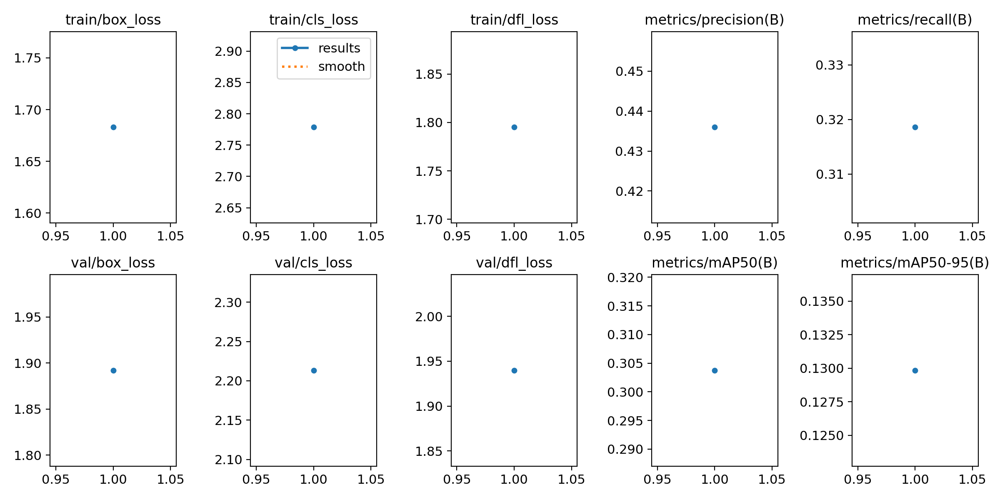

In [9]:
from IPython.display import Image, display

# display(Image(filename='/kaggle/working/runs/detect/smoke_fire_mode/results.png'))
display(Image(filename='/content/runs/detect/smoke_fire_model2/results.png'))


In [10]:
# Bước 4: Chạy model để kiểm thử folder 'test'
# YOLO CLI document: https://docs.ultralytics.com/usage/cli/#__tabbed_1_1
results = model.predict('/kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/test/images', conf=0.25, save = True)  # chạy prediction trên ảnh trong /test/ với ngưỡng tin cậy là 0.25
# save=True sẽ lưu ảnh vào folder /prediction/
# webcam:
# results = model.predict('/kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/test/images', show= True ,conf=0.25)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2255 /kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/test/images/-189475_png.rf.b85d47a7ffdbb6a4f1e03160fb8cd426.jpg: 640x640 (no detections), 8.0ms
image 2/2255 /kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/test/images/-40654_png.rf.3deab4ec26797eaa19eb1e6b257eb519.jpg: 640x640 (no detections), 7.3ms
image 3/2255 /kaggle/input/firesmoke-detection-yolo-v9/Fire and Smoke Dataset/test/images/-478795_png.rf.8751

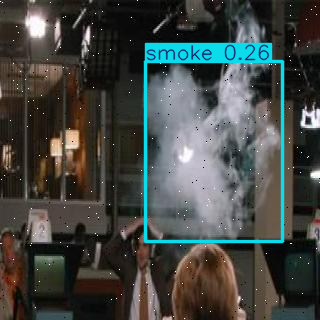

Predictions (as DataFrame):     name  class  confidence                                                box
0  smoke      1     0.26455  {'x1': 145.65994, 'y1': 61.65154, 'x2': 282.27...


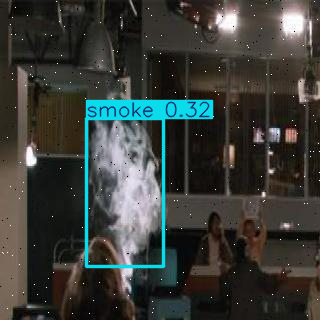

Predictions (as DataFrame):     name  class  confidence                                                box
0  smoke      1      0.3161  {'x1': 86.75684, 'y1': 118.0134, 'x2': 163.559...


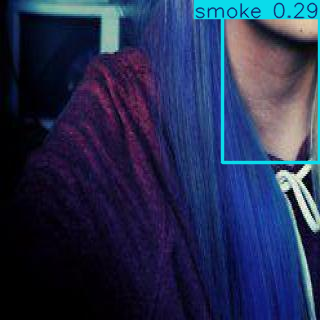

Predictions (as DataFrame):     name  class  confidence                                                box
0  smoke      1     0.29379  {'x1': 222.19664, 'y1': 0.39421, 'x2': 319.211...


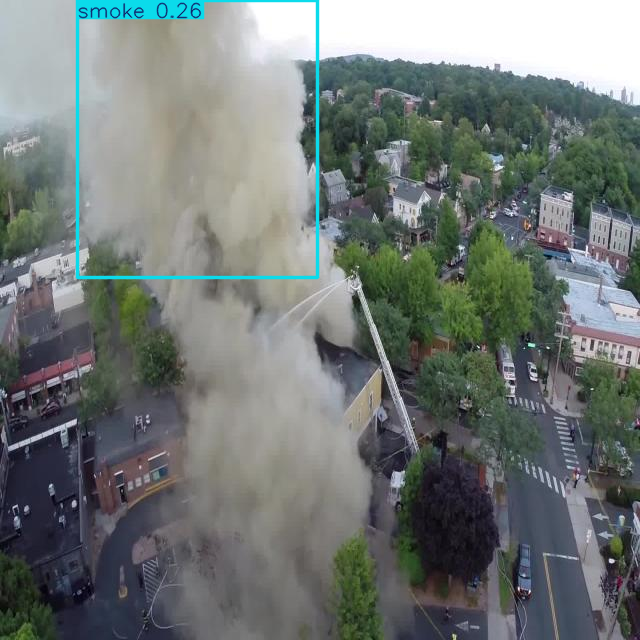

Predictions (as DataFrame):     name  class  confidence                                                box
0  smoke      1     0.26082  {'x1': 77.31666, 'y1': 0.0, 'x2': 317.01227, '...


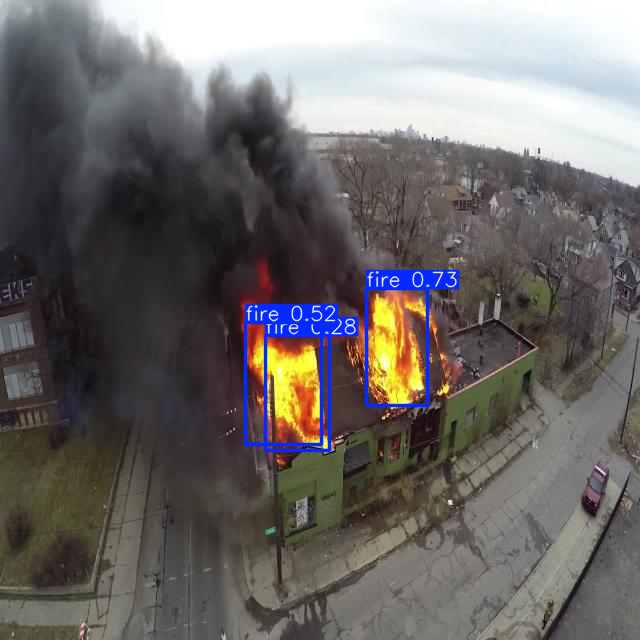

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.72914  {'x1': 366.2757, 'y1': 288.96936, 'x2': 427.31...
1  fire      0     0.51985  {'x1': 245.00467, 'y1': 322.25446, 'x2': 321.7...
2  fire      0     0.28073  {'x1': 265.07224, 'y1': 335.99896, 'x2': 329.0...


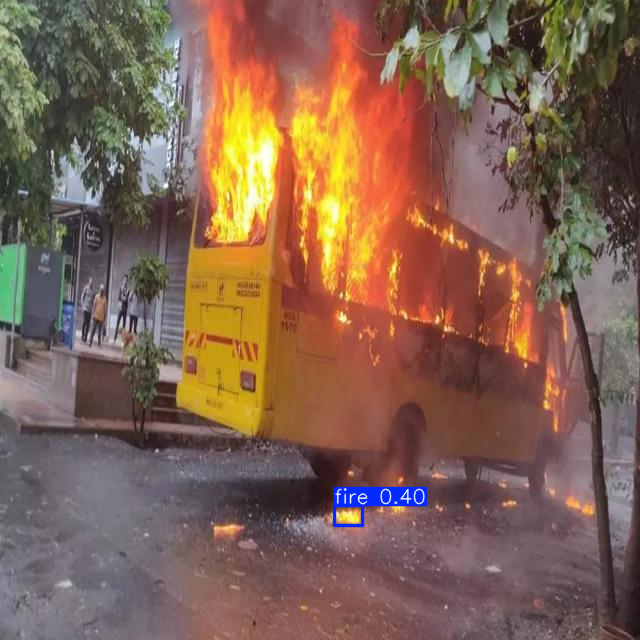

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.39515  {'x1': 334.50464, 'y1': 505.5694, 'x2': 362.09...


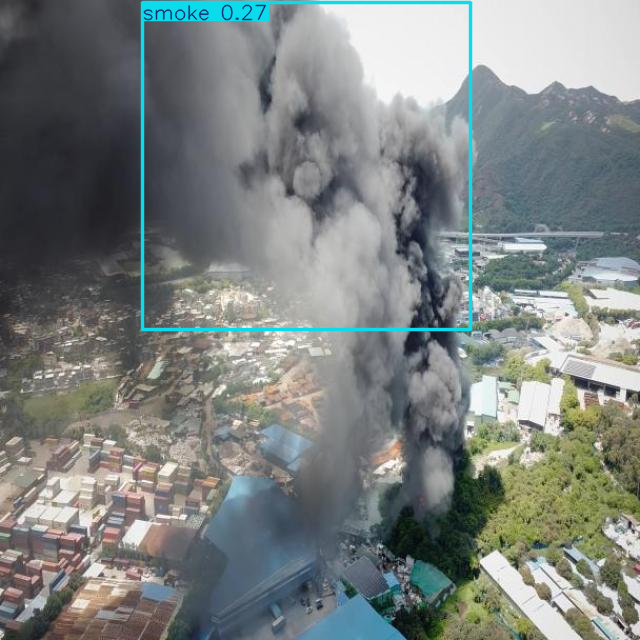

Predictions (as DataFrame):     name  class  confidence                                                box
0  smoke      1     0.27076  {'x1': 142.35828, 'y1': 2.2608, 'x2': 470.8706...


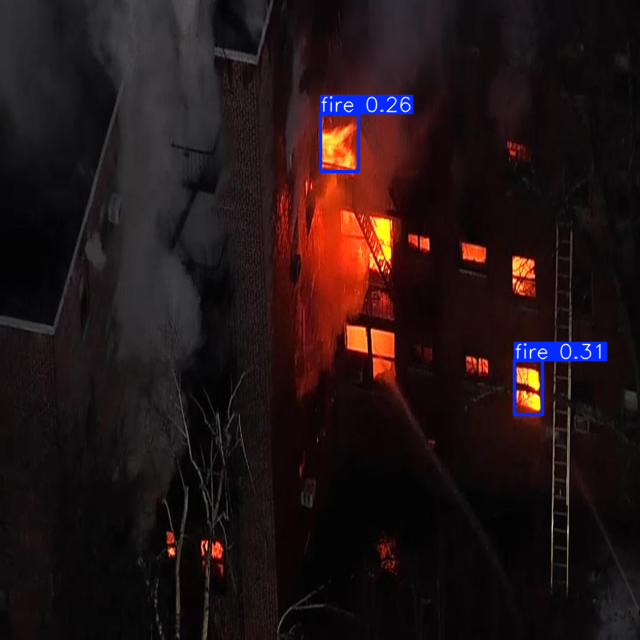

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.31149  {'x1': 514.81165, 'y1': 360.19461, 'x2': 542.7...
1  fire      0     0.26196  {'x1': 320.40894, 'y1': 113.77357, 'x2': 358.2...


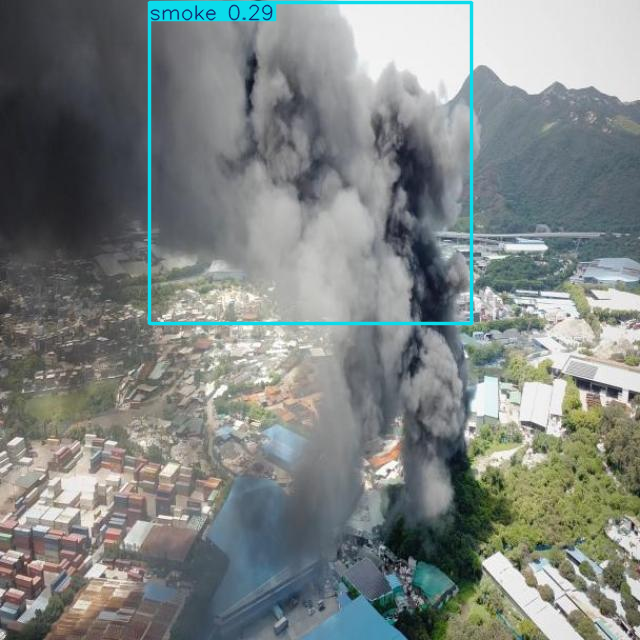

Predictions (as DataFrame):     name  class  confidence                                                box
0  smoke      1     0.28534  {'x1': 149.49988, 'y1': 2.11688, 'x2': 471.797...


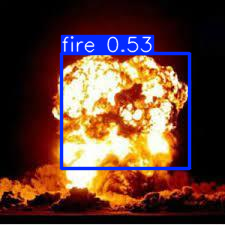

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.53499  {'x1': 61.94635, 'y1': 53.10481, 'x2': 189.211...


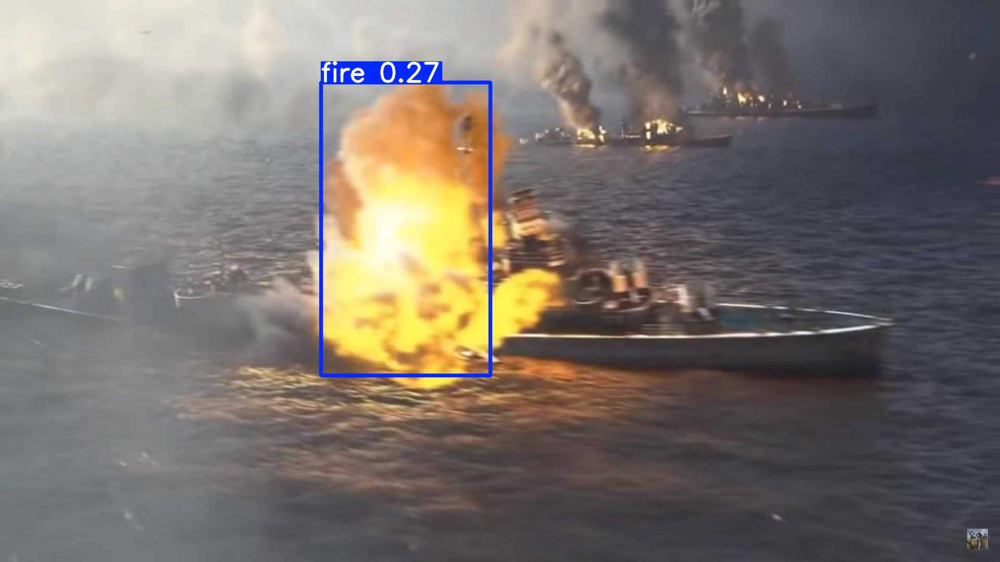

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.27021  {'x1': 616.34143, 'y1': 158.42484, 'x2': 941.4...


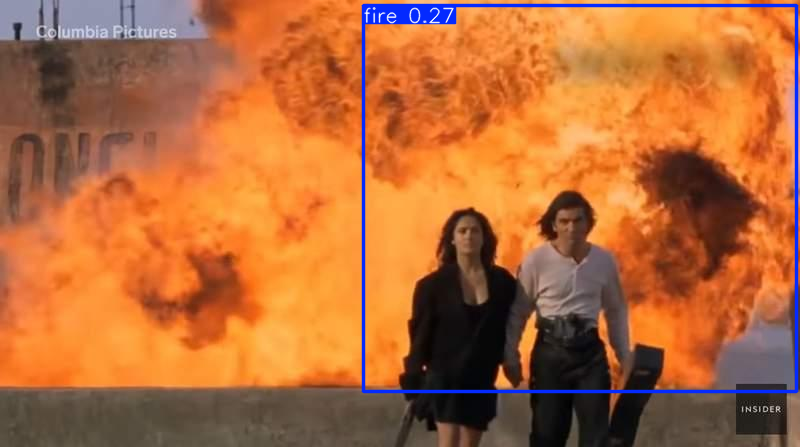

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.27095  {'x1': 363.4024, 'y1': 5.82344, 'x2': 796.2915...


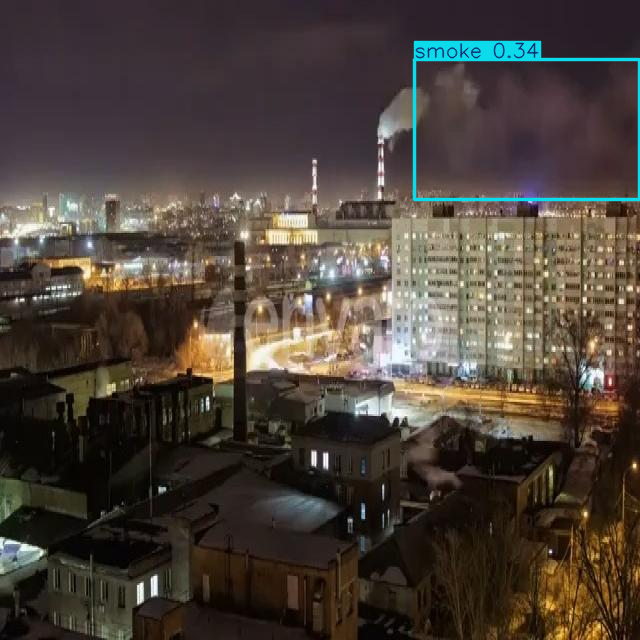

Predictions (as DataFrame):     name  class  confidence                                                box
0  smoke      1      0.3362  {'x1': 414.45767, 'y1': 59.00884, 'x2': 639.15...


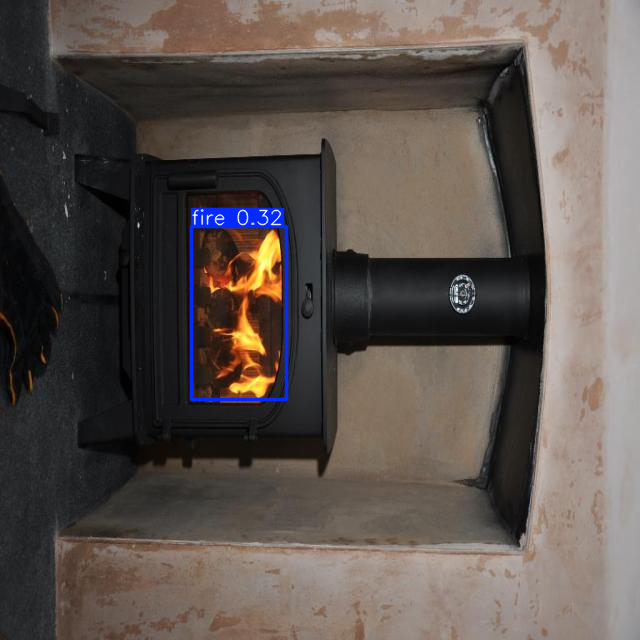

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.31553  {'x1': 191.08759, 'y1': 226.85599, 'x2': 286.6...


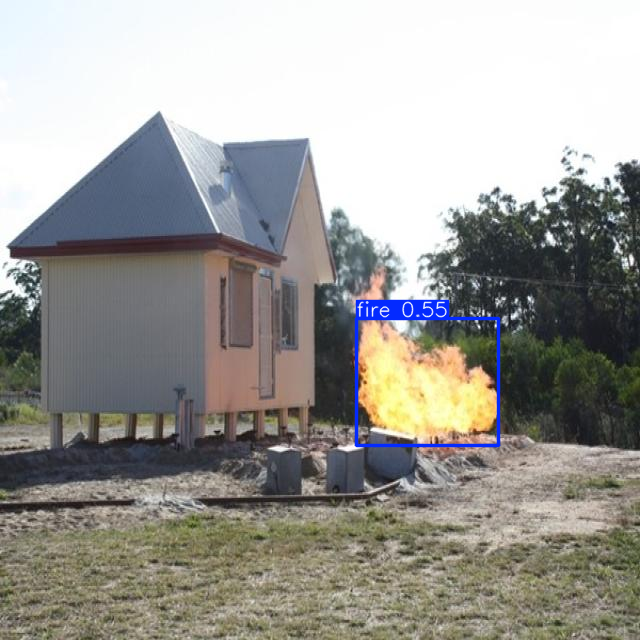

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.54931  {'x1': 356.79694, 'y1': 318.72449, 'x2': 498.2...


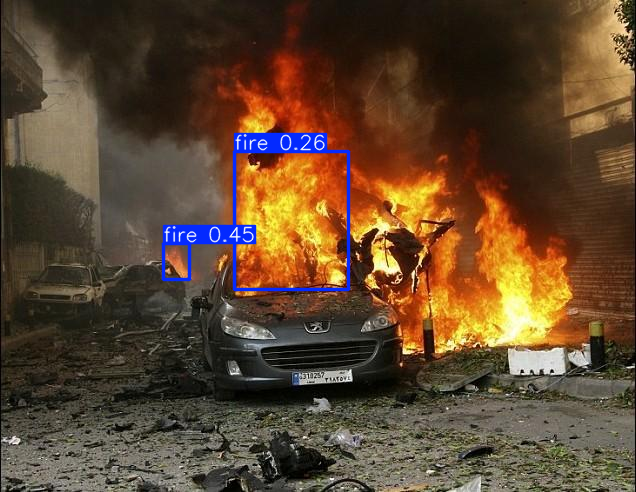

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.44638  {'x1': 163.57616, 'y1': 243.60675, 'x2': 189.0...
1  fire      0     0.26004  {'x1': 234.10913, 'y1': 151.51938, 'x2': 348.9...


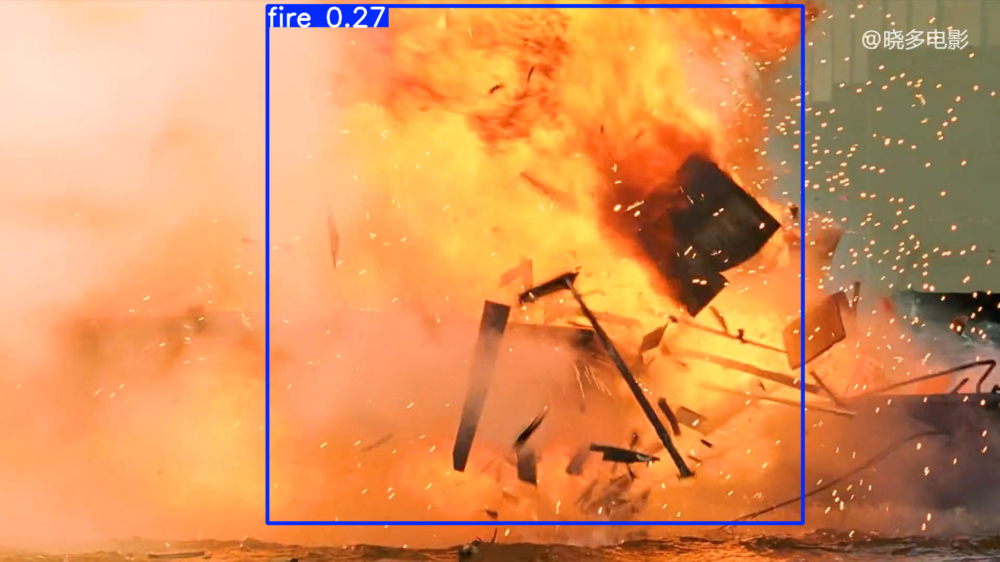

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.26901  {'x1': 513.29553, 'y1': 11.56512, 'x2': 1541.5...


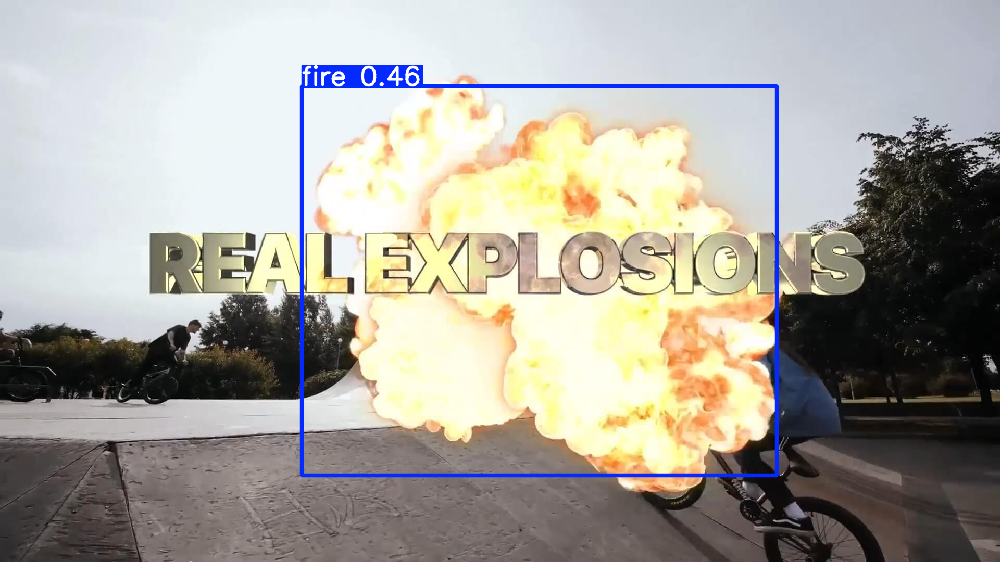

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.46163  {'x1': 579.27051, 'y1': 165.40082, 'x2': 1491....


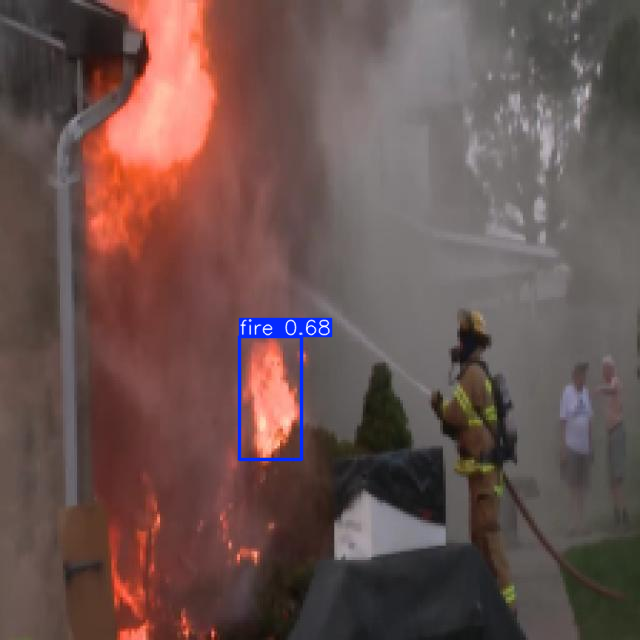

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0      0.6831  {'x1': 239.73062, 'y1': 336.64258, 'x2': 301.1...


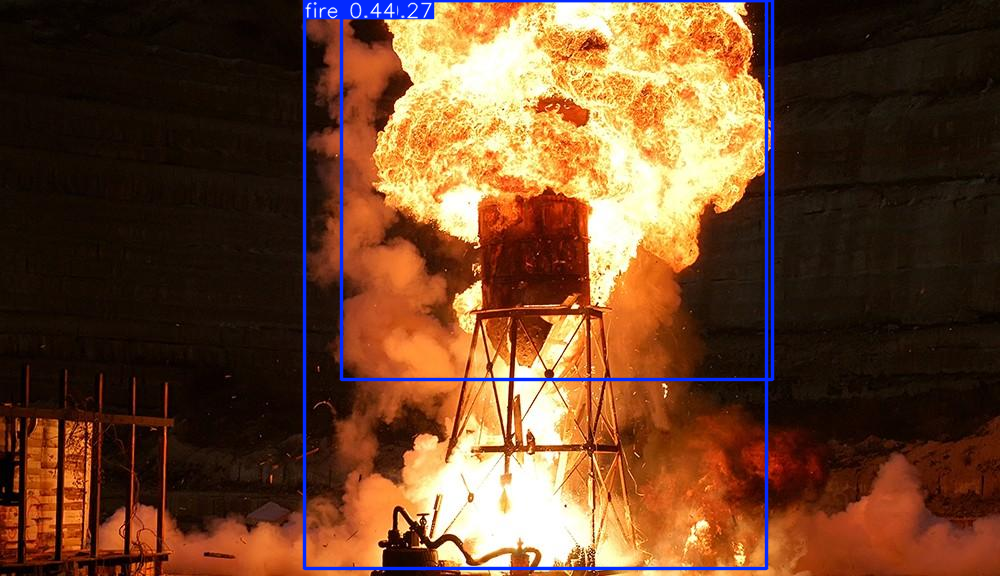

Predictions (as DataFrame):    name  class  confidence                                                box
0  fire      0     0.43557  {'x1': 304.69528, 'y1': 0.0, 'x2': 766.60437, ...
1  fire      0     0.27332  {'x1': 341.44055, 'y1': 0.0, 'x2': 772.20612, ...


In [13]:
# Bước 5: Hiển thị và lưu kết quả
count = 0
for result in results:
    # Chuyển kết quả sang DataFrame để kiểm tra các đối tượng được phát hiện
    results_df = result.to_df()

    # Kiểm tra xem DataFrame có trống không (nghĩa là không có đối tượng nào được phát hiện)
    if not results_df.empty:
        # Nếu có đối tượng được phát hiện, hiển thị và lưu kết quả
        result.show()
        result.save()  # lưu tại "runs/detect/predict" folder

        # In số object phát hiện, class name và confidence
        print(f"Predictions (as DataFrame): {results_df}")

        # Tăng bộ đếm và dừng lại sau khi xử lý 20 tệp
        count += 1
        if count >= 20:
            break

model được lưu tại huggingface:


https://huggingface.co/kappH/NhanDienKhoiLua/


ứng dụng trên gradio tại:


https://kapph-nhandienkhoilua.hf.space/

graphs: dataset structure diagram
data augmentation diagram
training & validation diagram (relates to how it uses the dataset)

demo video

# Tổng kết Đồ án Phát hiện Khói và Lửa

Đồ án này đã thành công trong việc xây dựng một hệ thống phát hiện khói và lửa sử dụng mô hình YOLOv8 được huấn luyện trên tập dữ liệu tùy chỉnh.

## Ưu điểm:

*   **Phát hiện sớm**: Hệ thống có khả năng phát hiện khói và lửa từ hình ảnh hoặc video, giúp cảnh báo sớm hơn so với các phương pháp truyền thống dựa vào cảm biến nhiệt hoặc khói tại một điểm cố định.
*   **Không xâm lấn**: Quá trình phát hiện dựa trên phân tích hình ảnh, không yêu cầu tiếp xúc vật lý với môi trường, phù hợp cho các khu vực rộng lớn hoặc khó tiếp cận.
*   **Chi phí triển khai linh hoạt**: Có thể tận dụng hạ tầng camera giám sát sẵn có, giảm chi phí so với việc lắp đặt hệ thống cảm biến dày đặc.
*   **Khả năng mở rộng**: Mô hình có thể được tinh chỉnh (fine-tune) hoặc huấn luyện lại với dữ liệu mới để cải thiện hiệu suất hoặc thích ứng với các môi trường khác nhau.
*   **Thông tin chi tiết**: Cung cấp thông tin về vị trí (thông qua bounding box) và loại đối tượng (khói hoặc lửa), giúp xác định rõ ràng mối đe dọa.

## Nhược điểm:

*   **Chưa cạnh tranh được so với cảm biến vật lý**: Trong một số trường hợp, cảm biến vật lý vẫn có thể phản ứng nhanh hơn hoặc chính xác hơn trong điều kiện lý tưởng (ví dụ: cảm biến khói trong không gian kín).
*   **Yêu cầu GPU hiệu năng cao**: Quá trình huấn luyện và suy luận (inference) của các mô hình học sâu như YOLOv8 yêu cầu phần cứng có GPU hiệu năng cao để đạt được tốc độ và hiệu quả mong muốn, đặc biệt là khi xử lý video thời gian thực.
*   **Chưa thể áp dụng nhận diện trên live webcam cho Gradio web app**: Do giới hạn về tài nguyên tính toán và băng thông trên các nền tảng triển khai miễn phí như Hugging Face Spaces, việc xử lý video từ webcam trực tiếp trên ứng dụng web còn gặp khó khăn.

## Hướng phát triển trong tương lai:

*   **Tích hợp vào Homeserver/Homelab**: Triển khai mô hình đã huấn luyện lên một homeserver hoặc homelab với GPU cục bộ để xử lý video từ các camera an ninh trong nhà hoặc văn phòng.
*   **Hệ thống cảnh báo tự động**: Khi hệ thống nhận diện khói hoặc lửa, tự động kích hoạt các hành động cảnh báo như gửi thông báo đến điện thoại, email, bật còi báo động, hoặc thậm chí là kích hoạt hệ thống chữa cháy tự động (trong môi trường kiểm soát và an toàn).
*   **Cải thiện hiệu suất trên thiết bị biên (Edge Devices)**: Nghiên cứu và tối ưu hóa mô hình để chạy hiệu quả hơn trên các thiết bị biên có tài nguyên hạn chế (ví dụ: Raspberry Pi, Jetson Nano) để giảm chi phí triển khai và tăng tính di động.
*   **Tăng cường dữ liệu và huấn luyện**: Mở rộng tập dữ liệu với nhiều kịch bản khói và lửa đa dạng hơn, đồng thời áp dụng các kỹ thuật huấn luyện nâng cao để cải thiện độ chính xác và khả năng chống nhiễu của mô hình.
*   **Phát hiện các dấu hiệu khác**: Mở rộng khả năng của hệ thống để phát hiện các dấu hiệu khác liên quan đến hỏa hoạn như thay đổi nhiệt độ bất thường (sử dụng camera nhiệt) hoặc chuyển động bất thường của đám đông trong trường hợp sơ tán.
*   **Phát triển ứng dụng web thời gian thực**: Tìm kiếm các giải pháp triển khai ứng dụng web cho phép xử lý video thời gian thực từ webcam, có thể thông qua các dịch vụ đám mây chuyên dụng hoặc tối ưu hóa luồng xử lý dữ liệu.